In [2]:
import collections
from etils import epath
from ml_collections import config_dict
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tqdm
import os

from chirp import audio_utils
from chirp.inference import a2o_utils
from chirp.inference import interface
from chirp.inference import tf_examples
from chirp.inference import models
from chirp.models import metrics
from chirp.taxonomy import namespace
from chirp.inference.search import bootstrap
from chirp.inference.search import search
from chirp.inference.search import display
from chirp.inference.classify import classify
from chirp.inference.classify import data_lib

2024-04-26 12:06:08.754693: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 12:06:08.754752: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 12:06:08.756256: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-26 12:06:08.764880: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-26 12:06:10.457495: W tensorflow/comp

In [2]:
#@title Basic Configuration. { vertical-output: true }

#@markdown Choose what data to work with.
#@markdown * For local data (most cases), choose 'filesystem'.
#@markdown * For Australian Acoustic Observatory, select 'a2o'.
#@markdown This will cause many options (like model_choice) to be overridden.
#@markdown Note that you will need an Authentication Token from:
#@markdown https://data.acousticobservatory.org/my_account
data_source = 'filesystem' #@param['filesystem', 'a2o']
a2o_auth_token = '' #@param {type:'string'}

#@markdown Define the model: Usually perch or birdnet.
model_choice = 'perch'  #@param {type:'string'}
#@markdown Set the base directory for the project.
working_dir = '.'  #@param {type:'string'}

#@markdown Set the embedding and labeled data directories.
labeled_data_path = epath.Path(working_dir) / 'labeled_outputs'
custom_classifier_path = epath.Path(working_dir) / 'custom_classifier'

#@markdown The embeddings_path should be detected automatically, but can be
#@markdown overridden.
embeddings_path = ''

In [3]:
#@title Load Project State and Models. { vertical-output: true }

if data_source == 'a2o':
  embedding_config = a2o_utils.get_a2o_embeddings_config()
  bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_config(
      embedding_config=embedding_config,
      annotated_path=labeled_data_path,
      embeddings_glob = '*/embeddings-*')
  embeddings_path = embedding_config.output_dir
elif (embeddings_path
      or (epath.Path(working_dir) / 'embeddings/config.json').exists()):
  if not embeddings_path:
    # Use the default embeddings path, as it seems we found a config there.
    embeddings_path = epath.Path(working_dir) / 'embeddings'
  # Get relevant info from the embedding configuration.
  bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_path(
      embeddings_path=embeddings_path,
      annotated_path=labeled_data_path)
  if (bootstrap_config.model_key == 'separate_embed_model'
      and not separation_model_path.strip()):
    separation_model_key = 'separator_model_tf'
    separation_model_path = bootstrap_config.model_config.separator_model_tf_config.model_path
else:
  raise ValueError('No embedding configuration found.')

project_state = bootstrap.BootstrapState(
    bootstrap_config, a2o_auth_token=a2o_auth_token)

separator = None

2024-04-25 13:26:58.886877: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15517 MB memory:  -> device: 0, name: Quadro GP100, pci bus id: 0000:25:00.0, compute capability: 6.0
2024-04-25 13:26:58.887806: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 15517 MB memory:  -> device: 1, name: Quadro GP100, pci bus id: 0000:5b:00.0, compute capability: 6.0
2024-04-25 13:26:58.893442: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 15517 MB memory:  -> device: 2, name: Quadro GP100, pci bus id: 0000:9b:00.0, compute capability: 6.0


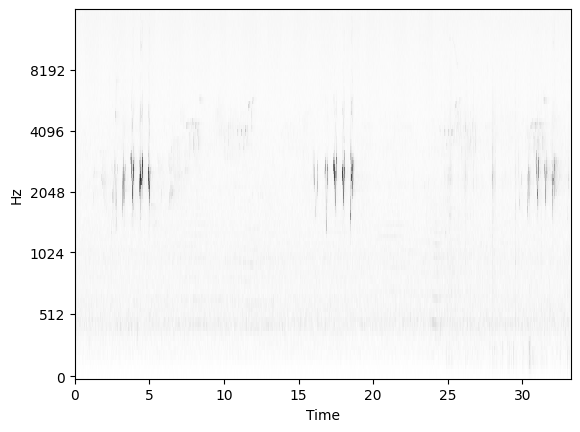

--------------------------------------------------------------------------------
Selected audio window:


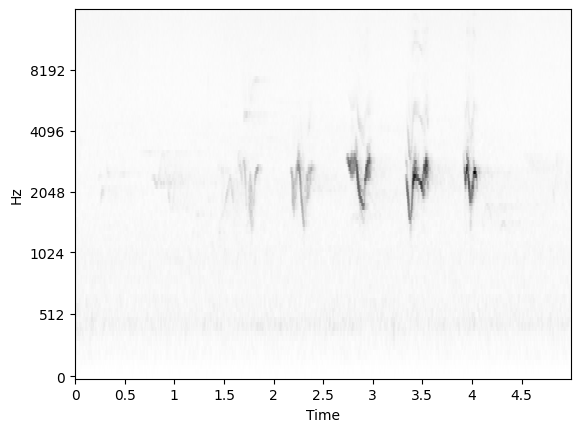

In [4]:
#@title Load query audio. { vertical-output: true }

#@markdown You may specify:
#@markdown * an audio filepath (like `/home/me/audio/example.wav`),
#@markdown * a Xeno-Canto id (like `xc12345`), or
#@markdown * an audio file URL (like
#@markdown https://upload.wikimedia.org/wikipedia/commons/7/7c/Turdus_merula_2.ogg).
audio_path = './target_recordings/weta_song.mp3'  #@param
#@markdown Choose the start time for the audio window within the file.
#@markdown We will focus on the model's `window_size_s` seconds of audio,
#@markdown starting from `start_s` seconds into the file.
start_s = 1  #@param

window_s = bootstrap_config.model_config['window_size_s']
sample_rate = bootstrap_config.model_config['sample_rate']
audio = audio_utils.load_audio(audio_path, sample_rate)

# Display the full file.
display.plot_audio_melspec(audio, sample_rate)

# Display the selected window.
print('-' * 80)
print('Selected audio window:')
st = int(start_s * sample_rate)
end = int(st + window_s * sample_rate)
if end > audio.shape[0]:
  end = audio.shape[0]
  st = max([0, int(end - window_s * sample_rate)])
audio_window = audio[st:end]
display.plot_audio_melspec(audio_window, sample_rate)

query_audio = audio_window
sep_outputs = None

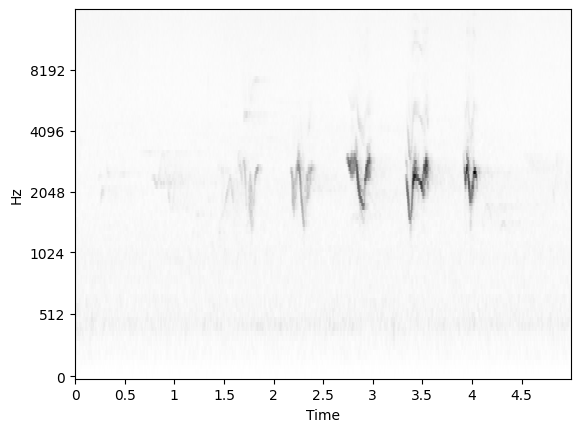

2024-04-25 13:27:18.567271: I external/local_xla/xla/service/service.cc:168] XLA service 0x1c334120 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-25 13:27:18.567324: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): Quadro GP100, Compute Capability 6.0
2024-04-25 13:27:18.567331: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (1): Quadro GP100, Compute Capability 6.0
2024-04-25 13:27:18.567337: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (2): Quadro GP100, Compute Capability 6.0
2024-04-25 13:27:18.919429: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-25 13:27:18.926835: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:38] Ignoring Assert operator jax2tf_infer_fn_/assert_equal_1/Assert/AssertGuard/Assert
2024-04-25 13:27:19.599148: I ext

In [5]:
#@title Select the query channel. { vertical-output: true }

#@markdown Choose a name for the class.
query_label = 'weta'  #@param
#@markdown If you have applied separation, choose a channel.
#@markdown Ignored if no separation model is being used.
query_channel = 0  #@param

if query_channel < 0 or sep_outputs is None:
  query_audio = audio_window
else:
  query_audio = sep_outputs.separated_audio[query_channel].copy()

display.plot_audio_melspec(query_audio, sample_rate)

outputs = project_state.embedding_model.embed(query_audio)
query = outputs.pooled_embeddings('first', 'first')

14912it [00:08, 1775.48it/s]


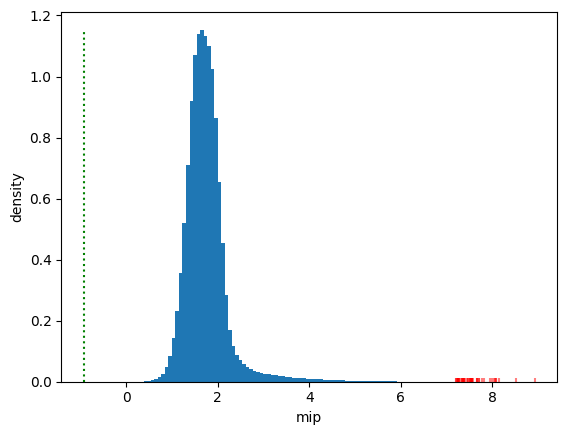

In [6]:
#@title Run Top-K Search. { vertical-output: true }

#@markdown Number of search results to capture.
top_k = 50  #@param

#@markdown Target distance for search results.
#@markdown This lets us try to hone in on a 'classifier boundary' instead of
#@markdown just looking at the closest matches.
#@markdown Set to 'None' for raw 'best results' search.
target_score = None  #@param

metric = 'mip'  #@param['euclidean', 'mip', 'cosine']

random_sample = False  #@param

ds = project_state.create_embeddings_dataset(shuffle_files=True)
results, all_scores = search.search_embeddings_parallel(
    ds, query,
    hop_size_s=bootstrap_config.embedding_hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=random_sample)

# Plot histogram of distances
ys, _, _ = plt.hist(all_scores, bins=128, density=True)
hit_scores = [r.score for r in results.search_results]
plt.scatter(hit_scores, np.zeros_like(hit_scores), marker='|',
            color='r', alpha=0.5)

plt.xlabel(metric)
plt.ylabel('density')
if target_score is not None:
  plt.plot([target_score, target_score], [0.0, np.max(ys)], 'r:')
  # Compute the proportion of scores < target_score
  hit_percentage = (all_scores < target_score).mean()
  print(f'score < target_score percentage : {hit_percentage:5.3f}')
min_score = np.min(all_scores)
plt.plot([min_score, min_score], [0.0, np.max(ys)], 'g:')

plt.show()

In [8]:
r = results.search_results[-1]
print(r)
project_state.source_map = lambda fp, o: project_state.default_source_map(fp) 
project_state.source_map(r.filename, r.timestamp_offset)

SearchResult(embedding=array([[ 0.02942385, -0.04019594, -0.03269825, ...,  0.02763325,
         0.19948654,  0.01110721]], dtype=float32), score=7.2182546, sort_score=7.2182546, filename='C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230617_053000.wav', timestamp_offset=415.0, audio=None, label_widgets=())


ValueError: No file found for file_id C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230617_053000.wav.

Results Page: 0 / 2


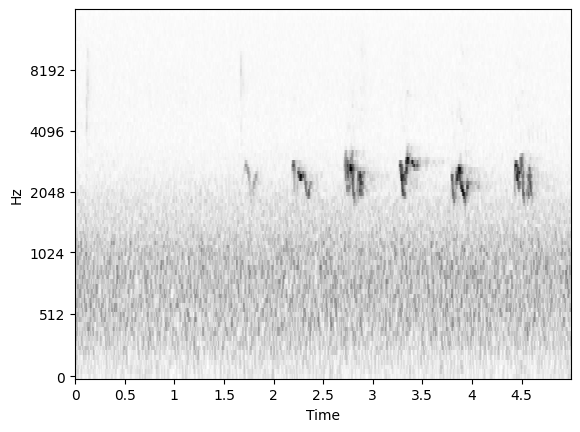

rank        : 0
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 200.00
score       : 8.94


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


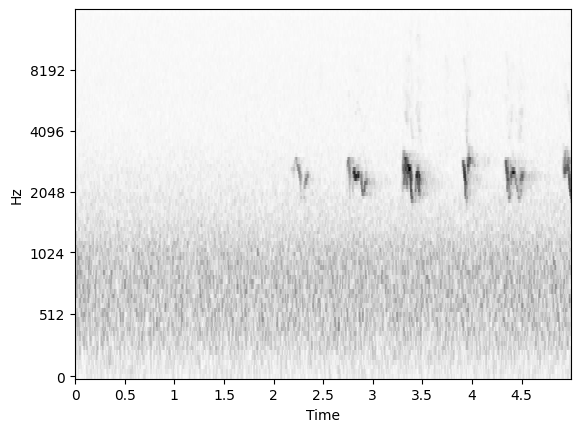

rank        : 1
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 105.00
score       : 8.54


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


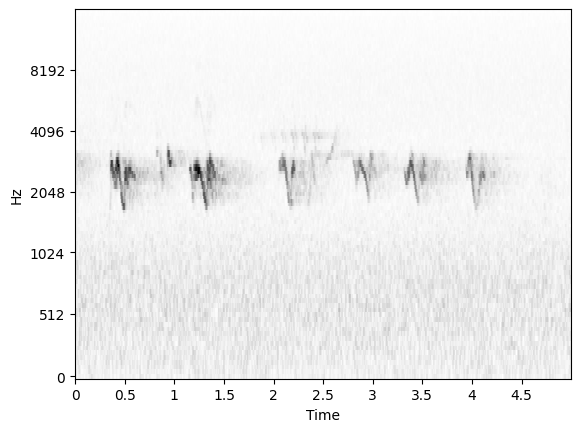

rank        : 2
source file : 26-LEIA/Data/26-LEIA_20230616_193000.wav
offset_s    : 230.00
score       : 8.15


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


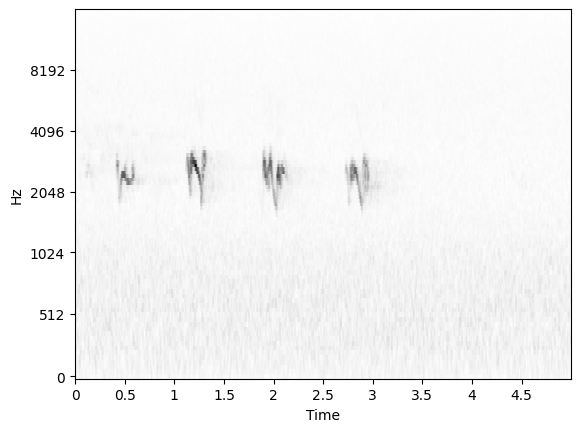

rank        : 3
source file : 26-LEIA/Data/26-LEIA_20230616_193000.wav
offset_s    : 455.00
score       : 8.09


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


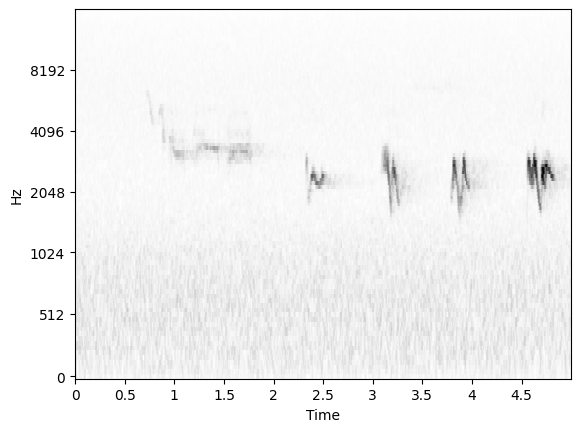

rank        : 4
source file : 26-LEIA/Data/26-LEIA_20230616_193000.wav
offset_s    : 480.00
score       : 8.08


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


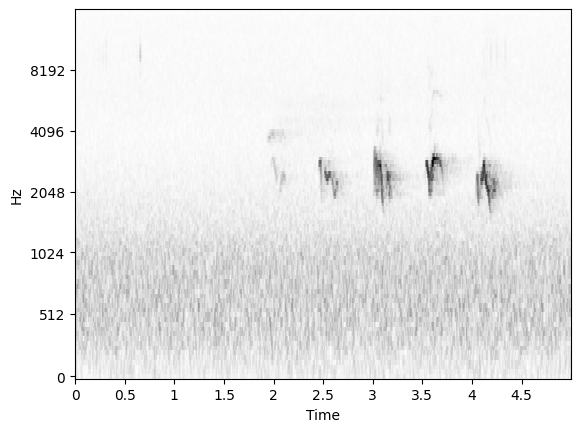

rank        : 5
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_170000.wav
offset_s    : 165.00
score       : 8.07


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


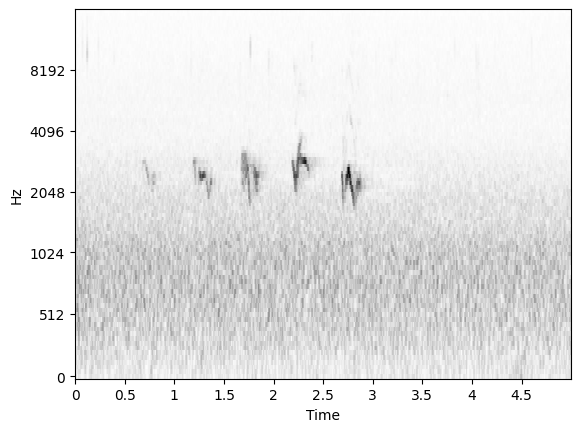

rank        : 6
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_170000.wav
offset_s    : 80.00
score       : 8.05


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


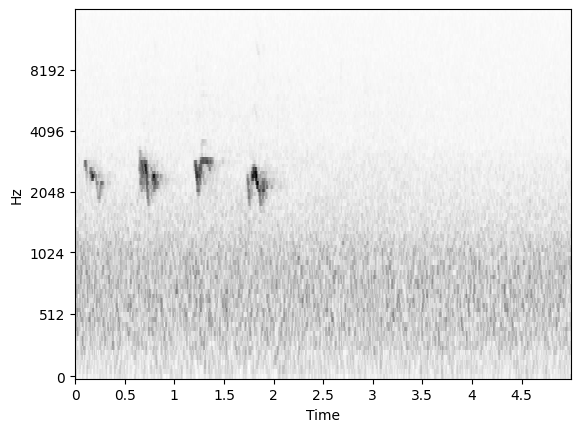

rank        : 7
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 160.00
score       : 8.00


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


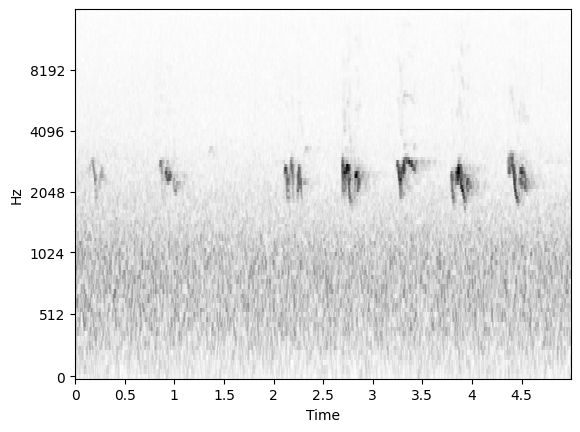

rank        : 8
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 65.00
score       : 7.97


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


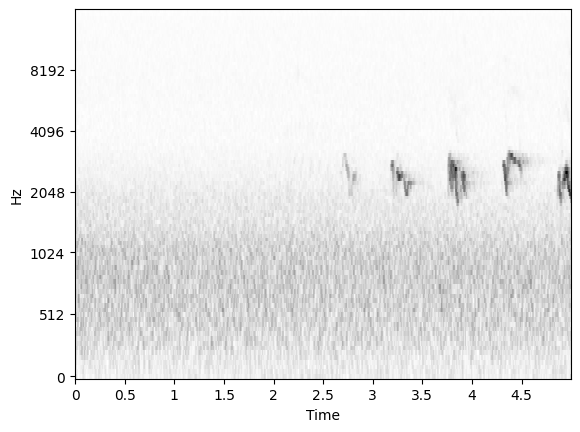

rank        : 9
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 220.00
score       : 7.83


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


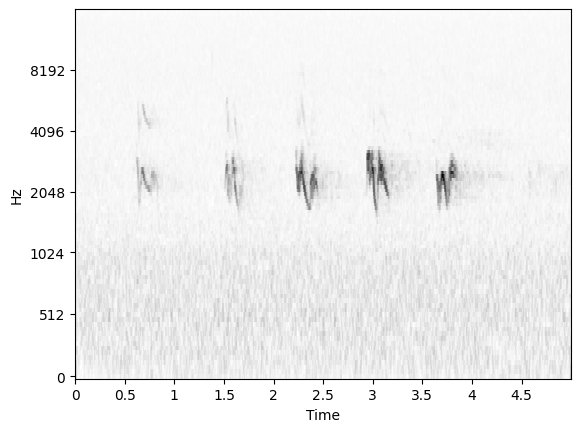

rank        : 10
source file : C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230616_200000.wav
offset_s    : 690.00
score       : 7.79


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


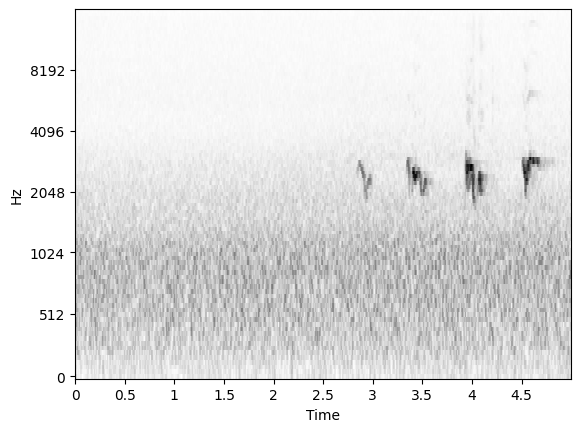

rank        : 11
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 20.00
score       : 7.73


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


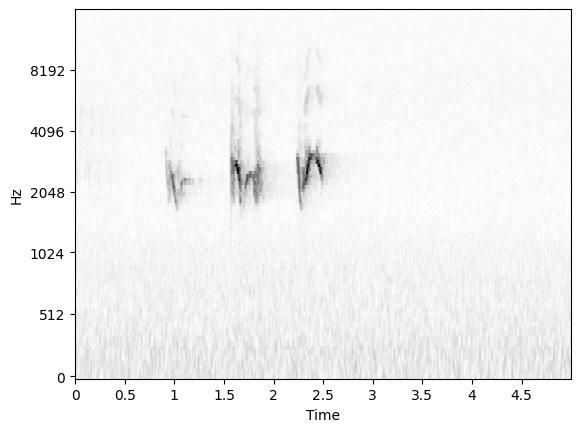

rank        : 12
source file : D4-RED-CAPLE/Data/D4-RED-CAPLE_20230612_073000.wav
offset_s    : 665.00
score       : 7.72


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


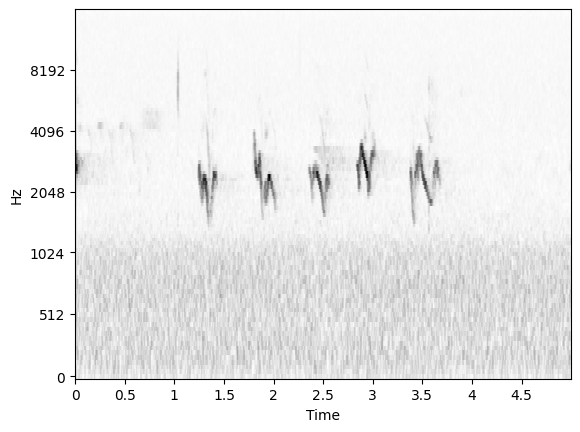

rank        : 13
source file : 7-ORANGE-7-CAP/Data/ORANGE-7-CAP_20230603_200000.wav
offset_s    : 345.00
score       : 7.68


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


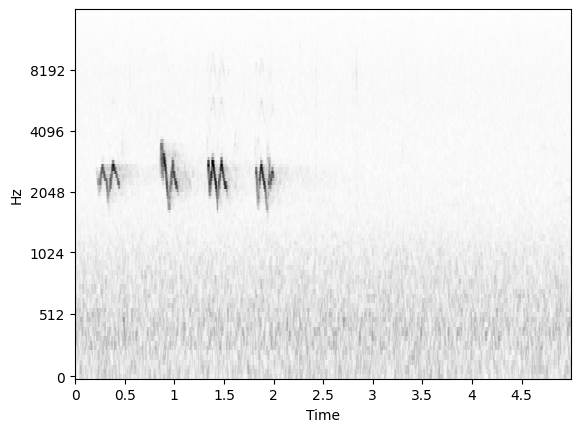

rank        : 14
source file : 26-LEIA/Data/26-LEIA_20230610_063000.wav
offset_s    : 30.00
score       : 7.67


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


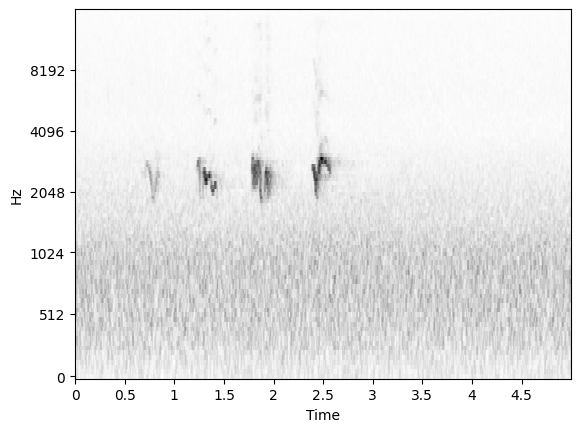

rank        : 15
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 5.00
score       : 7.67


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


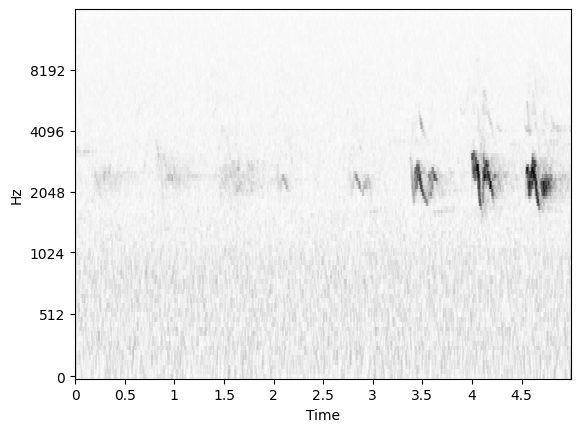

rank        : 16
source file : C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230615_200000.wav
offset_s    : 375.00
score       : 7.58


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


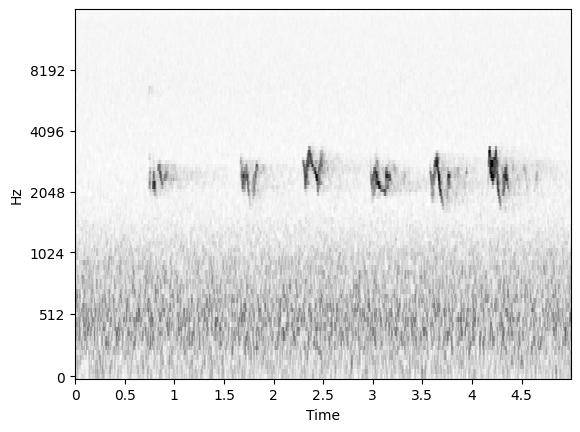

rank        : 17
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230609_190000.wav
offset_s    : 875.00
score       : 7.57


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


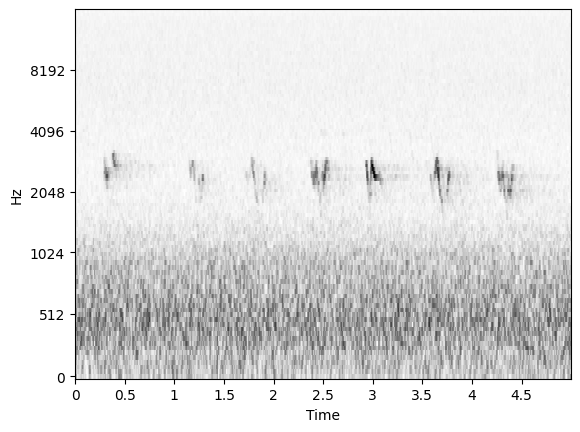

rank        : 18
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230609_193000.wav
offset_s    : 685.00
score       : 7.56


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


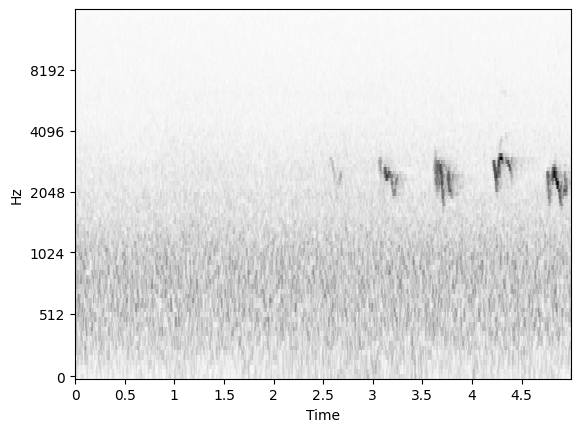

rank        : 19
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 145.00
score       : 7.56


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


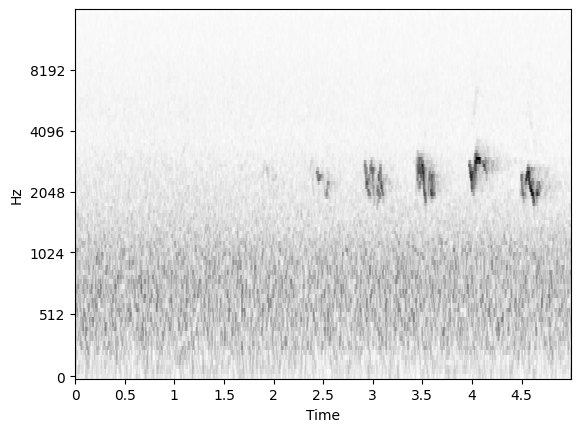

rank        : 20
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_180000.wav
offset_s    : 270.00
score       : 7.56


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


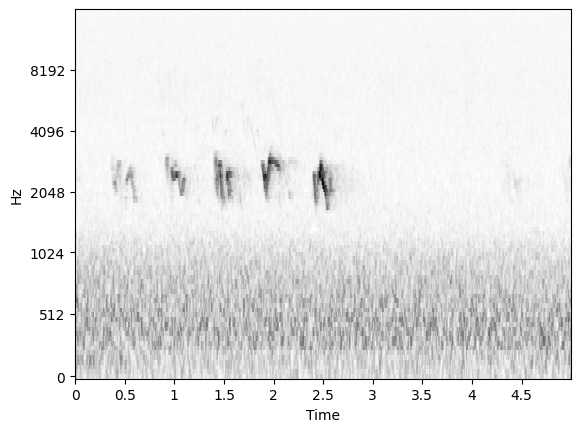

rank        : 21
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230621_093000.wav
offset_s    : 400.00
score       : 7.55


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


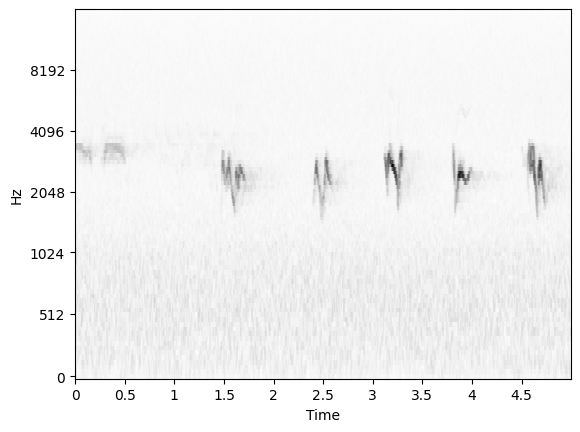

rank        : 22
source file : 26-LEIA/Data/26-LEIA_20230616_193000.wav
offset_s    : 440.00
score       : 7.55


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


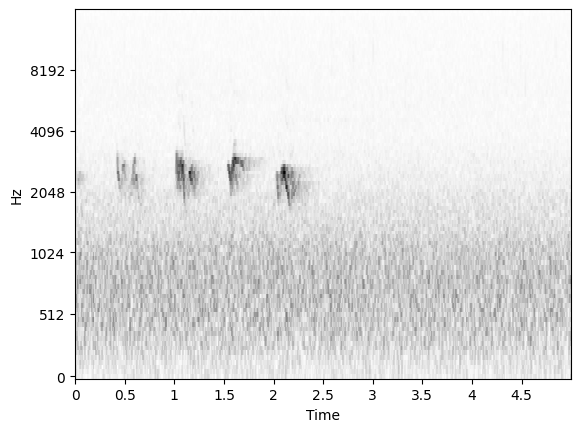

rank        : 23
source file : 8-PURPLE-8-CAP/Data/PURPLE-8-CAP_20230618_170000.wav
offset_s    : 110.00
score       : 7.52


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


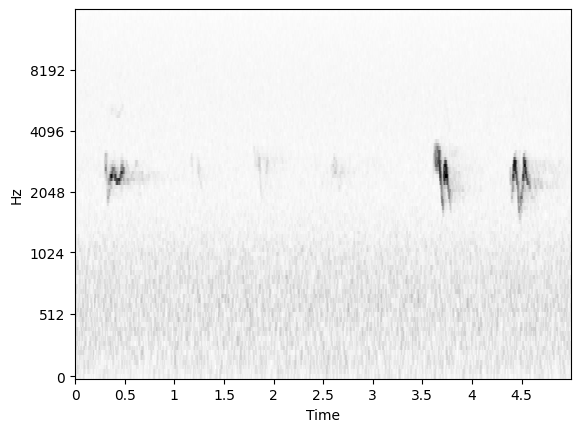

rank        : 24
source file : 26-LEIA/Data/26-LEIA_20230616_193000.wav
offset_s    : 405.00
score       : 7.51


Button(description='weta', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------
Results Page: 0 / 2


Button(description='Prev Page', style=ButtonStyle())

Button(description='Next Page', style=ButtonStyle())

In [7]:
#@title Display results. { vertical-output: true }

samples_per_page = 25
page_state = display.PageState(
    np.ceil(len(results.search_results) / samples_per_page))

display.display_paged_results(
    results, page_state, samples_per_page,
    project_state=project_state,
    embedding_sample_rate=project_state.embedding_model.sample_rate,
    exclusive_labels=False,
    checkbox_labels=[query_label, 'unknown'],
    max_workers=5,
)

In [10]:
# Model specific parameters: PLEASE DO NOT CHANGE THE CODE IN THIS CELL.
config = config_dict.ConfigDict()
embed_fn_config = config_dict.ConfigDict()
embed_fn_config.model_key = 'taxonomy_model_tf'
model_config = config_dict.ConfigDict()


model_config.window_size_s = 5.0

model_config.hop_size_s = 5.0

# All audio in this tutorial is resampled to 32 kHz.
model_config.sample_rate = 32000

# The location of the pre-trained model.
model_config.model_path = './bird-vocalization-classifier/'

# Only write embeddings to reduce size. The Perch codebase supports serializing
# a variety of metadata along with the embeddings, but for the purposes of this
# tutorial we will not need to make use of those features.
embed_fn_config.write_embeddings = True
embed_fn_config.write_logits = False
embed_fn_config.write_separated_audio = False
embed_fn_config.write_raw_audio = False

config.embed_fn_config = embed_fn_config
embed_fn_config.model_config = model_config

config.shard_len_s = -1
config.num_shards_per_file = -1

# Number of parent directories to include in the filename. This allows us to
# provess raw audio that lives in multiple directories.
config.embed_fn_config.file_id_depth = 2

# Number of TFRecord files to create.
config.tf_record_shards = 1

In [17]:
data_source = 'filesystem' 

# Define the model: Usually perch or birdnet.
model_choice = 'perch'  #@param
# Set the base directory for the project.
working_dir = '.'  #@param

a2o_auth_token = ''

# Set the embedding and labeled data directories.
labeled_data_path = epath.Path(working_dir) / 'labeled'
custom_classifier_path = epath.Path(working_dir) / 'bird-vocalization-classifier'

# The embeddings_path should be detected automatically, but can be overridden.
embeddings_path = ''

In [20]:
#@title Load Existing Project State and Models. { vertical-output: true }

# If you have already computed embeddings, run this cell to load models
# and find existing data.

if data_source == 'a2o':
  embedding_config = a2o_utils.get_a2o_embeddings_config()
  bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_config(
      embedding_config=embedding_config,
      annotated_path=labeled_data_path,
      embeddings_glob = '*/embeddings-*')
  embeddings_path = embedding_config.output_dir
elif (embeddings_path
      or (epath.Path(working_dir) / 'embeddings/config.json').exists()):
  if not embeddings_path:
    # Use the default embeddings path, as it seems we found a config there.
    embeddings_path = epath.Path(working_dir) / 'embeddings'
  # Get relevant info from the embedding configuration.
  bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_path(
      embeddings_path=embeddings_path,
      annotated_path=labeled_data_path)
else:
  raise ValueError('No embedding configuration found.')

project_state = bootstrap.BootstrapState(
    bootstrap_config, a2o_auth_token=a2o_auth_token)

cfg = config_dict.ConfigDict({
    'model_path': custom_classifier_path,
    'logits_key': 'custom',
})
loaded_model = interface.LogitsOutputHead.from_config(cfg)
model = loaded_model.logits_model
class_list = loaded_model.class_list
# print('Loaded custom model with classes: ')
# print('\t' + '\n\t'.join(class_list.classes))

In [21]:
#@title Write classifier inference CSV. { vertical-output: true }

output_filepath = epath.Path(working_dir) / 'inference.csv'  #@param

# Set detection thresholds.
default_threshold = 0.0  #@param
if default_threshold is None:
  # In this case, all logits are written. This can lead to very large CSV files.
  class_thresholds = None
else:
  class_thresholds = collections.defaultdict(lambda: default_threshold)
  # Set per-class thresholds here.
  class_thresholds['my_class'] = 1.0

# Classes for which we do not want to write detections.
exclude_classes = ['unknown']  #@param

# include_classes is ignored if empty.
# If non-empty, only scores for these classes will be written.
include_classes = []  #@param

# Create the embeddings dataset.
embeddings_ds = tf_examples.create_embeddings_dataset(
    embeddings_path, file_glob='embeddings-*')

classify.write_inference_csv(
    embeddings_ds=embeddings_ds,
    model=model,
    labels=class_list.classes,
    output_filepath=output_filepath,
    threshold=class_thresholds,
    embedding_hop_size_s=bootstrap_config.embedding_hop_size_s,
    include_classes=include_classes,
    exclude_classes=exclude_classes)

TypeError: in user code:

    File "/home/mschulist/miniconda3/lib/python3.10/site-packages/chirp/inference/classify/classify.py", line 162, in classify_batch  *
        logits = model(flat_emb)

    TypeError: '_UserObject' object is not callable


In [5]:
output_filepath = epath.Path(working_dir) / 'inference.csv'  #@param

# Set detection thresholds.
default_threshold = 0.0  #@param
if default_threshold is None:
  # In this case, all logits are written. This can lead to very large CSV files.
  class_thresholds = None
else:
  class_thresholds = collections.defaultdict(lambda: default_threshold)
  # Set per-class thresholds here.
  class_thresholds['my_class'] = 1.0

# Classes for which we do not want to write detections.
exclude_classes = ['unknown']  #@param

# include_classes is ignored if empty.
# If non-empty, only scores for these classes will be written.
include_classes = []  #@param

# Create the embeddings dataset.
embeddings_ds = tf_examples.create_embeddings_dataset(
    embeddings_dir, file_glob='embeddings-*')

classify.write_inference_csv(
    embeddings_ds=embeddings_ds,
    model=model,
    labels=class_list.classes,
    output_filepath=output_filepath,
    threshold=class_thresholds,
    embedding_hop_size_s=bootstrap_config.embedding_hop_size_s,
    include_classes=include_classes,
    exclude_classes=exclude_classes)

2024-04-17 14:56:52.747665: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15517 MB memory:  -> device: 0, name: Quadro GP100, pci bus id: 0000:25:00.0, compute capability: 6.0
2024-04-17 14:56:52.748413: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 15517 MB memory:  -> device: 1, name: Quadro GP100, pci bus id: 0000:5b:00.0, compute capability: 6.0
2024-04-17 14:56:52.748957: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 15517 MB memory:  -> device: 2, name: Quadro GP100, pci bus id: 0000:9b:00.0, compute capability: 6.0


NameError: name 'model' is not defined

In [15]:
target_classes = ['GCKI', 'Unknown']

In [16]:
audio_path = './target_recordings/gcki_song.mp3'
audio = audio_utils.load_audio(audio_path, model_config.sample_rate)


Selected audio window:


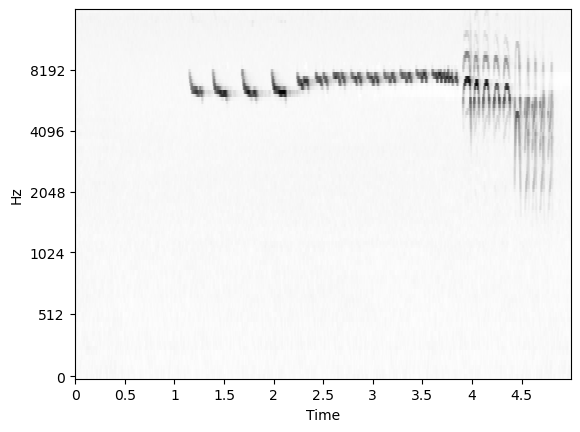

In [17]:
start_s = 1

print('Selected audio window:')
st = int(start_s * model_config.sample_rate)
end = int(st + model_config.window_size_s * model_config.sample_rate)
if end > audio.shape[0]:
  end = audio.shape[0]
  st = max([0, int(end - model_config.window_size_s * model_config.sample_rate)])
audio_window = audio[st:end]
display.plot_audio_melspec(audio_window, model_config.sample_rate)

query_audio = audio_window
sep_outputs = None

In [18]:
query = query_audio

embedded_query = embed_fn.embedding_model.embed(query).embeddings[ :, 0, :]

In [19]:
embeddings_ds

<_PrefetchDataset element_spec={'embedding': TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), 'embedding_shape': TensorSpec(shape=(None,), dtype=tf.int64, name=None), 'filename': TensorSpec(shape=(), dtype=tf.string, name=None), 'raw_audio': TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), 'raw_audio_shape': TensorSpec(shape=(None,), dtype=tf.int64, name=None), 'separated_audio': TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), 'separated_audio_shape': TensorSpec(shape=(None,), dtype=tf.int64, name=None), 'timestamp_s': TensorSpec(shape=(), dtype=tf.float32, name=None)}>

In [20]:
# Number of search results to capture.
top_k = 10 # @param {type:"number"}

# The Perch codebase supports:
#  'euclidean', which is the standard euclidean distance
#  'cosine', which is the cosine similarity,
#  'mip', which is Maximum Inner Product
metric = 'euclidean'  #@param['euclidean', 'mip', 'cosine']

# Target distance for search results.
# This lets us try to hone in on a 'classifier boundary' instead of just
# looking at the closest matches.
# Set to 'None' for raw 'best results' search.
target_score = None #@param

results, all_scores = search.search_embeddings_parallel(
    embeddings_ds, embedded_query,
    hop_size_s=model_config.hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=False)

14867it [00:09, 1525.01it/s]


In [21]:
# fix results filepaths (totally not hacky...)
for result in results:
    basename = os.path.basename(result.filename)
    dir_name = os.path.basename(os.path.dirname(result.filename))
    result.filename = f"{dir_name}/{basename}"
    print(result.filename)

Data/25-JABBA_20230612_000000.wav
Data/23-LADYBUG_20230620_100000.wav
Data/3-YELLOW_20230612_180000.wav
Data/23-LADYBUG_20230620_093000.wav
Data/26-LEIA_20230612_160000.wav
Data/23-LADYBUG_20230617_070128.wav
Data/3-YELLOW_20230612_180000.wav
Data/27-YODA_20230612_180000.wav
Data/15-PEACOCK_20230612_180000.wav
Data/27-YODA_20230612_210000.wav


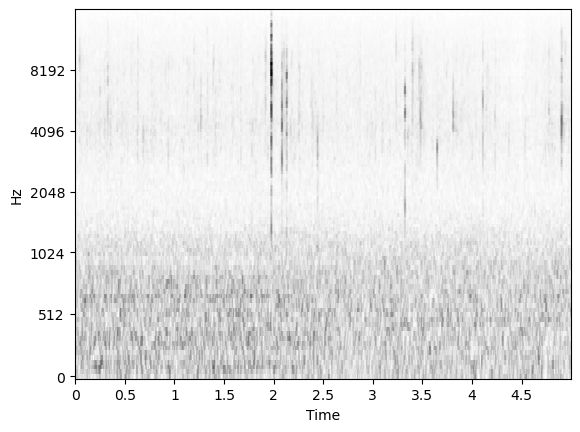

rank        : 0
source file : Data/25-JABBA_20230612_000000.wav
offset_s    : 805.00
score       : 3.27


Button(description='GCKI', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


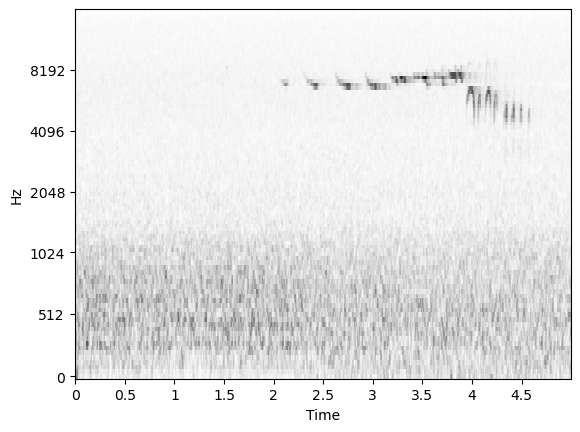

rank        : 1
source file : Data/23-LADYBUG_20230620_100000.wav
offset_s    : 405.00
score       : 3.27


Button(description='GCKI', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


ValueError: Can only apply convolutional EMA to inputs with shape [B, T, D].

In [22]:
# Display the search results for user labeling.
display.display_search_results(
    results, model_config.sample_rate, project_state.source_map,
    checkbox_labels=target_classes,
    max_workers=5)